In [27]:
# Import necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


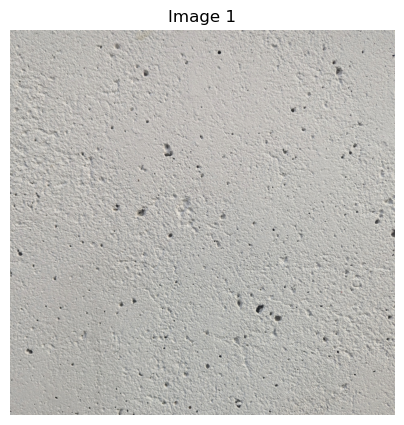

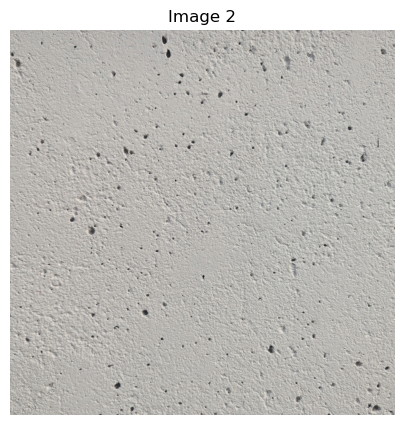

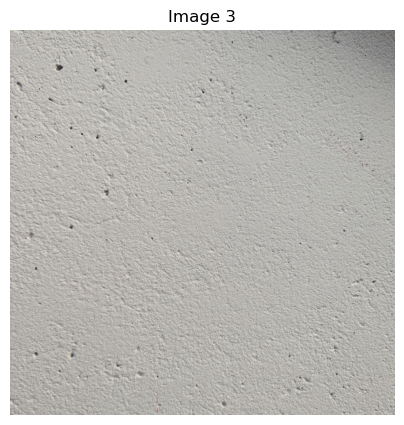

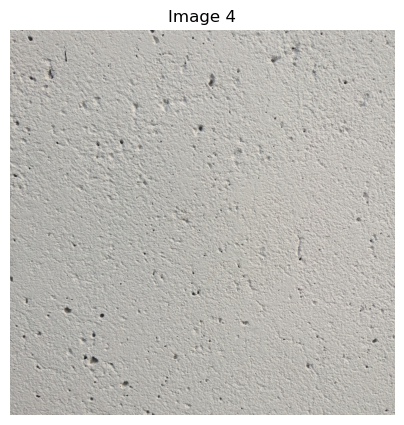

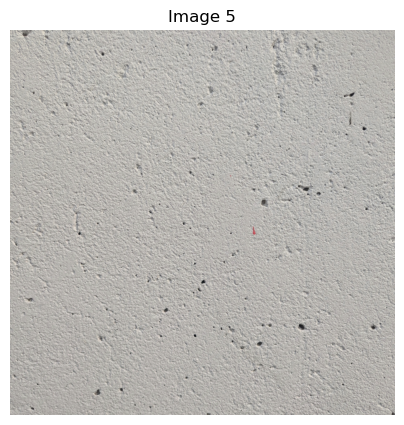

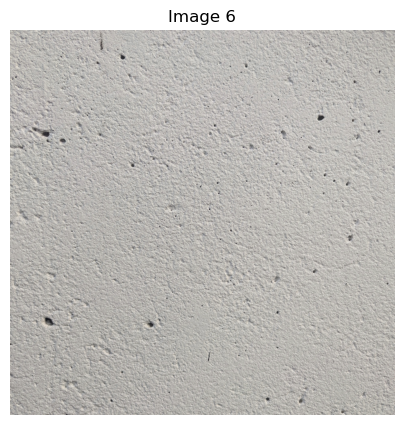

In [31]:
# Load images from paths and convert to RGB
def load_images(image_paths):
    images = []
    for path in image_paths:
        img = cv2.imread(path)
        if img is None:
            print(f"Warning: Unable to load image at path {path}")
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)
    return images

# Define the image paths (replace with your actual paths)
image_paths = [
    
    r"C:\Users\ragsh\Desktop\FALL 24\RSN\LAB5\data-2\image_1.jpg",
    r"C:\Users\ragsh\Desktop\FALL 24\RSN\LAB5\data-2\image_2.jpg",
    r"C:\Users\ragsh\Desktop\FALL 24\RSN\LAB5\data-2\image_3.jpg",
    r"C:\Users\ragsh\Desktop\FALL 24\RSN\LAB5\data-2\image_4.jpg",
    r"C:\Users\ragsh\Desktop\FALL 24\RSN\LAB5\data-2\image_5.jpg",
    r"C:\Users\ragsh\Desktop\FALL 24\RSN\LAB5\data-2\image_6.jpg"
]

# Load and display images
images = load_images(image_paths)
for i, img in enumerate(images):
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.title(f"Image {i+1}")
    plt.axis("off")
    plt.show()


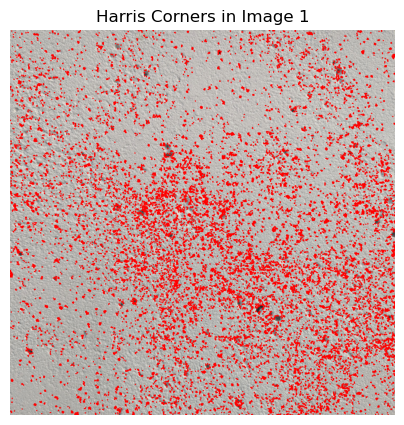

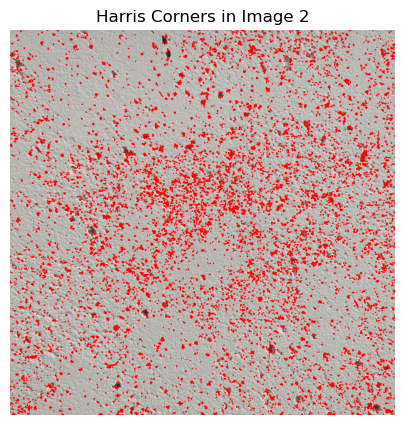

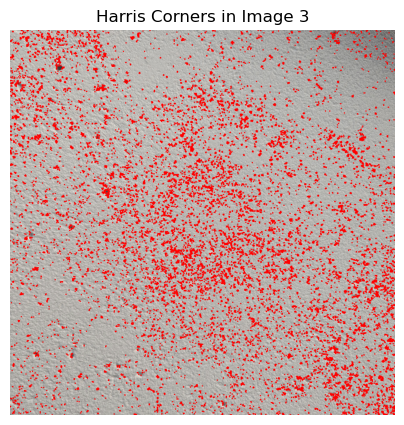

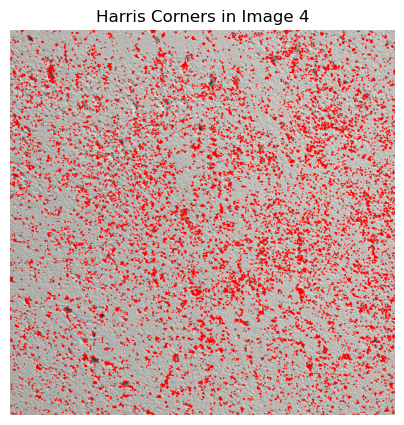

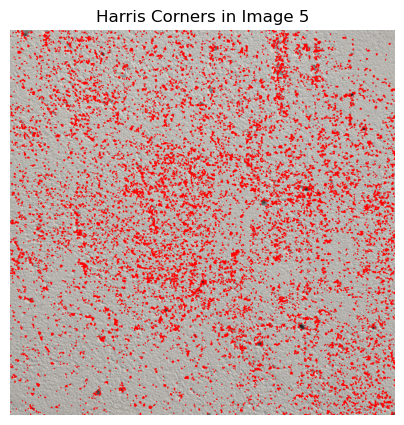

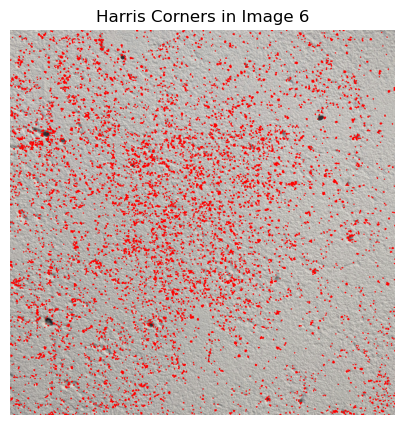

In [33]:
# Detect and visualize Harris corners
def detect_harris_corners(image, harris_threshold=0.005):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    gray = np.float32(gray)
    harris_corners = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)
    harris_corners = cv2.dilate(harris_corners, None)

    # Mark keypoints on the original image
    img_with_corners = image.copy()
    img_with_corners[harris_corners > harris_threshold * harris_corners.max()] = [255, 0, 0]
    return img_with_corners, harris_corners

# Display Harris corners for each image
for i, img in enumerate(images):
    img_with_corners, _ = detect_harris_corners(img)
    plt.figure(figsize=(5, 5))
    plt.imshow(img_with_corners)
    plt.title(f"Harris Corners in Image {i+1}")
    plt.axis("off")
    plt.show()


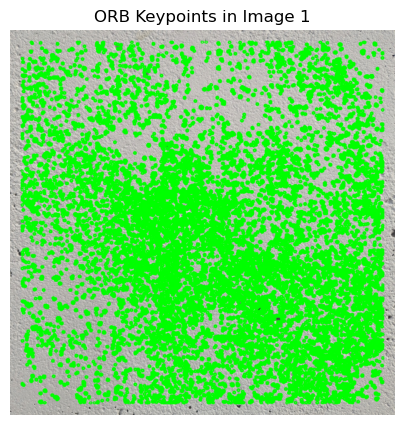

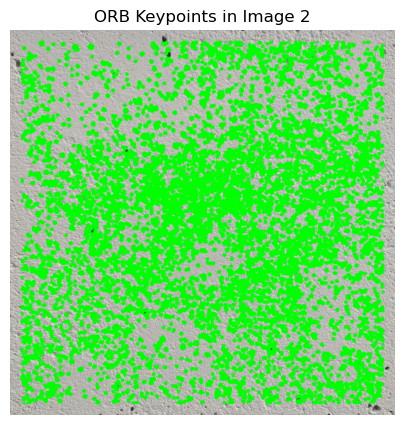

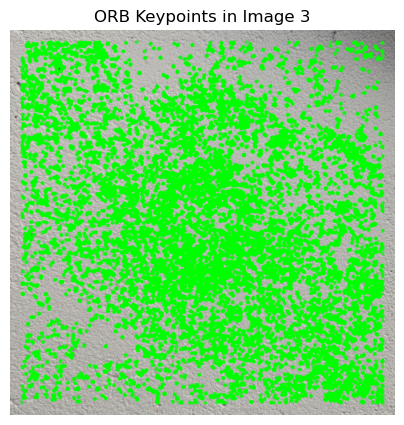

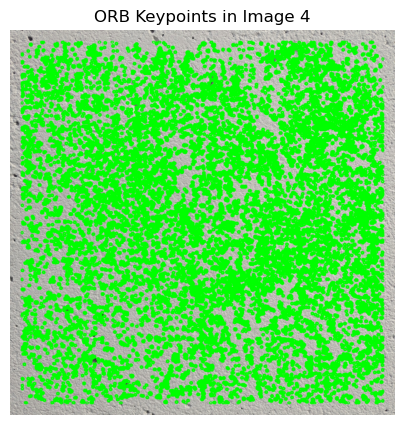

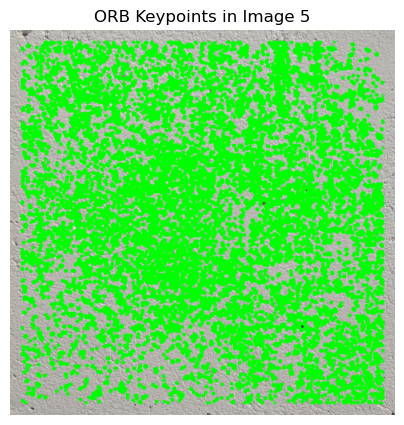

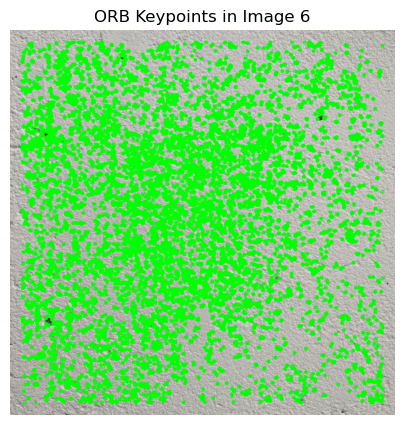

In [35]:
# Detect keypoints and compute descriptors using Harris corners and ORB
def detect_and_compute_keypoints(image, harris_threshold=0.005, orb_features=1000):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    gray = np.float32(gray)
    harris_corners = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)
    harris_corners = cv2.dilate(harris_corners, None)

    # Extract strong corners above threshold
    keypoints = np.argwhere(harris_corners > harris_threshold * harris_corners.max())
    keypoints = [cv2.KeyPoint(float(x[1]), float(x[0]), 1) for x in keypoints]

    # Compute descriptors for detected keypoints with ORB
    orb = cv2.ORB_create(nfeatures=orb_features)
    keypoints, descriptors = orb.compute(image, keypoints)
    return keypoints, descriptors

# Display ORB keypoints for each image
for i, img in enumerate(images):
    keypoints, _ = detect_and_compute_keypoints(img)
    img_with_keypoints = cv2.drawKeypoints(img, keypoints, None, color=(0, 255, 0))
    plt.figure(figsize=(5, 5))
    plt.imshow(img_with_keypoints)
    plt.title(f"ORB Keypoints in Image {i+1}")
    plt.axis("off")
    plt.show()


In [37]:
# Lowe's Ratio Test for filtering matches
def match_features(descriptors1, descriptors2, ratio=0.75):
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)
    good_matches = [m for m, n in matches if m.distance < ratio * n.distance]
    return good_matches


In [39]:
# Crop black borders from the stitched panorama for a cleaner look
def crop_black_borders(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        x, y, w, h = cv2.boundingRect(contours[0])
        return image[y:y+h, x:x+w]
    return image


In [41]:
# Stitch images with RANSAC and handle low-texture images
def stitch_images(images, ransac_thresh=10.0):
    stitched_image = images[0]  # Initialize with the first image

    for i in range(1, len(images)):
        # Detect keypoints and descriptors
        keypoints1, descriptors1 = detect_and_compute_keypoints(stitched_image)
        keypoints2, descriptors2 = detect_and_compute_keypoints(images[i])

        # Match features using Lowe's Ratio Test
        matches = match_features(descriptors1, descriptors2)
        if len(matches) < 4:
            print(f"Not enough matches between images {i} and {i+1}")
            continue

        # Extract coordinates of matched points
        src_pts = np.float32([keypoints1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([keypoints2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

        # Find homography with RANSAC to align images
        H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, ransac_thresh)
        
        # Warp the current image and blend it onto the stitched image canvas
        height, width, _ = stitched_image.shape
        warped_image = cv2.warpPerspective(images[i], H, (width + images[i].shape[1], height))

        # Overlay stitched image to form the panorama
        warped_image[0:height, 0:width] = stitched_image
        stitched_image = crop_black_borders(warped_image)  # Crop out excess borders

        # Display intermediate stitched result
        plt.figure(figsize=(10, 5))
        plt.imshow(stitched_image)
        plt.title(f"Stitched Image after Adding Image {i+1}")
        plt.axis("off")
        plt.show()

    return stitched_image


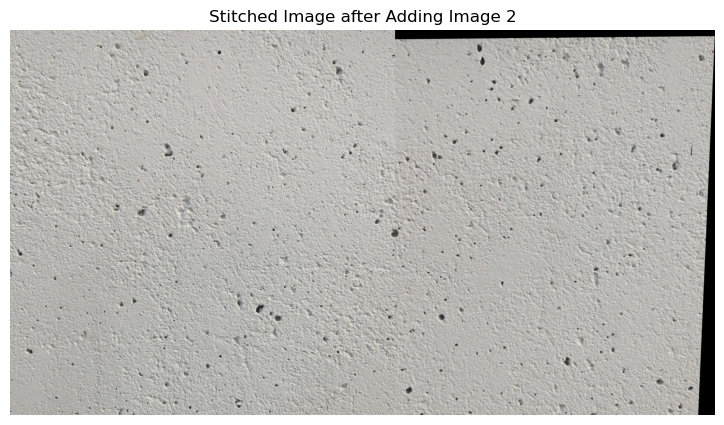

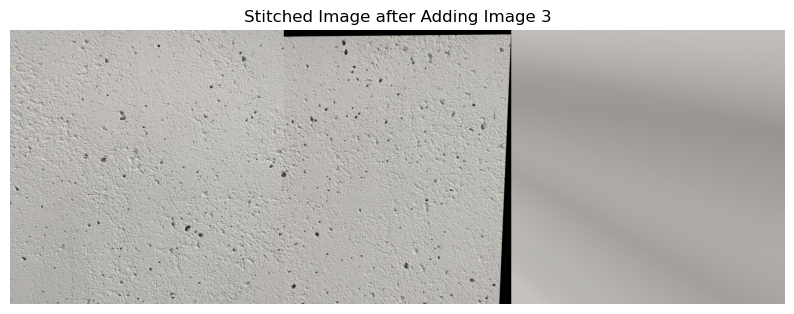

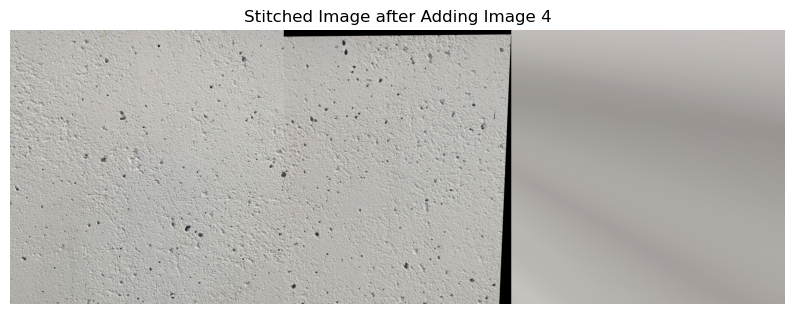

Not enough matches between images 4 and 5
Not enough matches between images 5 and 6


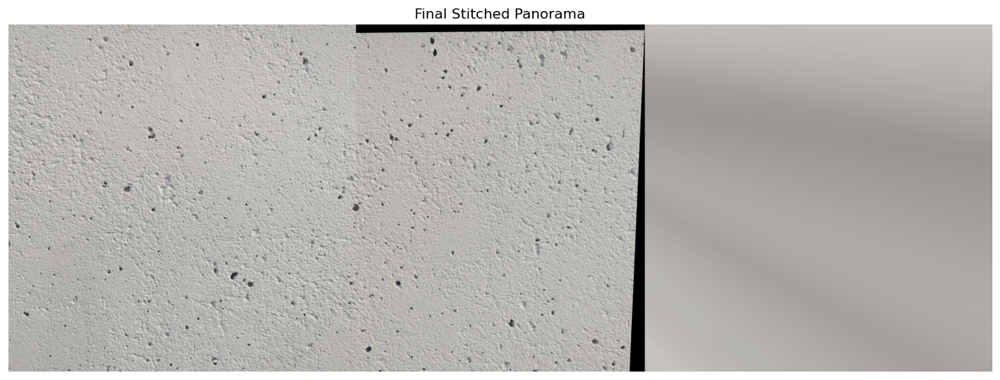

In [43]:
# Execute the full stitching process
ransac_threshold = 10.0  # Adjusted for low-texture images
stitched_image = stitch_images(images, ransac_thresh=ransac_threshold)

# Display the final stitched image
plt.figure(figsize=(15, 7))
plt.imshow(stitched_image)
plt.title("Final Stitched Panorama")
plt.axis("off")
plt.show()
